<a href="https://colab.research.google.com/github/ridlofebrio/PCVK_GANJIL_2024/blob/main/PCVK_Modul3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan citra
---------------------------------
Masukkan nilai kecerahan: 50


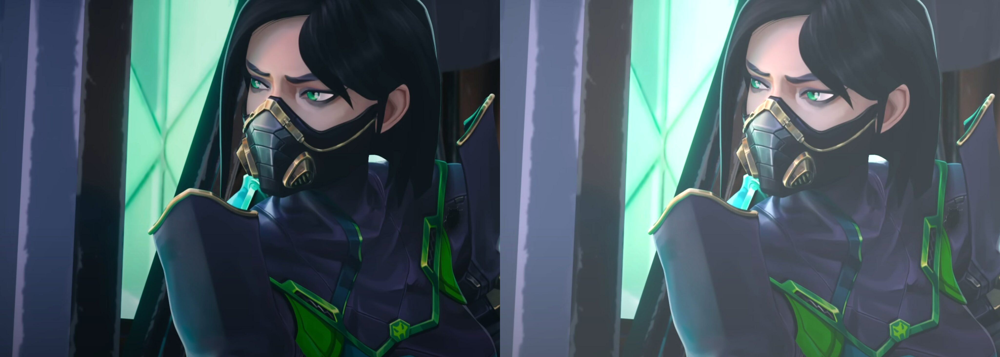

In [4]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra')
print('---------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/image/female.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
# for y in range(original.shape[0]):
#     for x in range(original.shape[1]):
#         for c in range(original.shape[2]):
#             brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

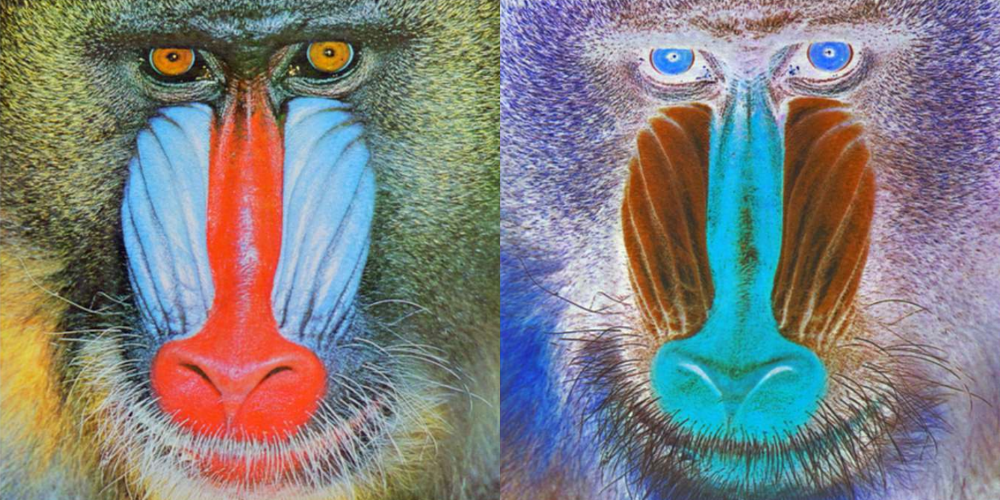

In [8]:
image = cv.imread('/content/drive/MyDrive/image/monyet.png')

# Melakukan inversi pada citra
image_inverted = 255 - image

image_combined = cv.hconcat([image, image_inverted])
cv2_imshow(image_combined)

Masukkan nilai kecerahan [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


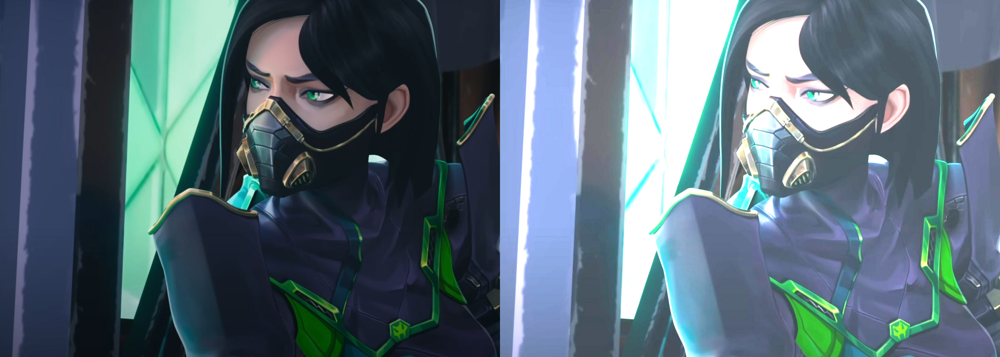

In [12]:
try:
    brightness = int(input('Masukkan nilai kecerahan [-255 - 255]: '))  # Beta (brightness)
    contrast = float(input('Masukkan kontras [1.0 - 3.0]: '))           # Alpha (contrast)
except ValueError:
    print('Error, input harus berupa angka')

original = cv.imread('/content/drive/MyDrive/image/female.jpg')

# Menggunakan cv.convertScaleAbs untuk menyesuaikan kontras dan kecerahan
# alpha: faktor kontras, beta: penyesuaian brightness
brightness_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

final_frame = cv.hconcat([original, brightness_image])

cv2_imshow(final_frame)




Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 50


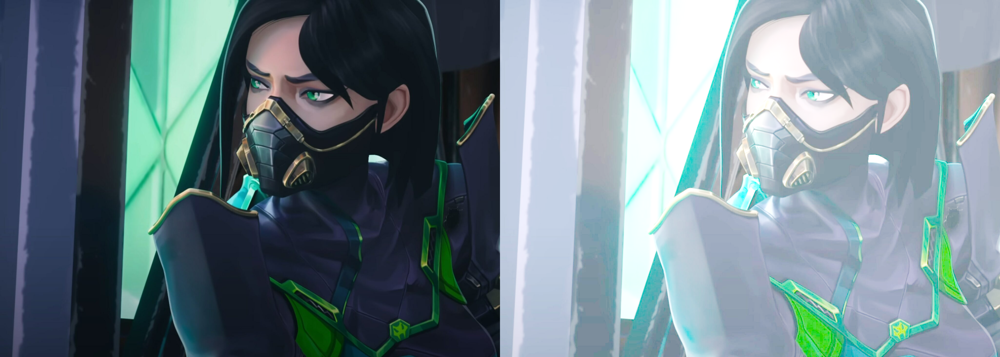

In [13]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('--------------------------------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/image/female.jpg')

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(brightness * (np.log(1 + original[y,x,c])), 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

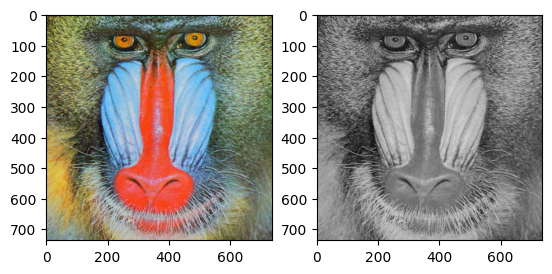

In [17]:
import matplotlib.pyplot as plt
img = cv.imread('/content/drive/MyDrive/image/monyet.png')
img_rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)

img_avg = cv.imread('/content/drive/MyDrive/image/monyet.png')
img_avg[:] = img_avg.mean(axis=-1, keepdims=1)
fig, ax = plt.subplots(1,2)
ax[0].imshow(img_rgb)
ax[1].imshow(img_avg)

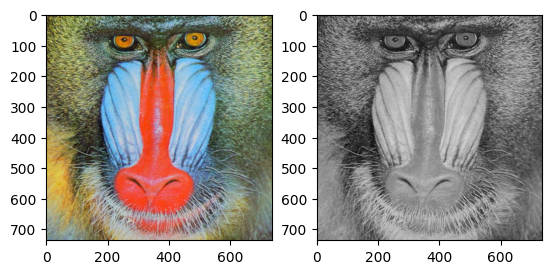

In [32]:
img_light = cv.imread('/content/drive/MyDrive/image/monyet.png')
img_light[:] = np.max(img_light,axis=-1,keepdims=10)/2+np.min(img_light,axis=-1,keepdims=1)/2
fig, ax = plt.subplots(1,2)
ax[0].imshow(img_rgb)
ax[1].imshow(img_light)

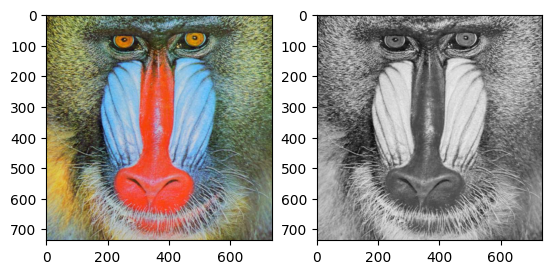

In [35]:
image_lum = cv.imread('/content/drive/MyDrive/image/monyet.png')
R, G, B = image_lum[:,:,0], image_lum[:,:,1], image_lum[:,:,2]
gray_image_lum = (0.21 * R) + (0.72 * G) + (0.07 * B)
fig, ax = plt.subplots(1,2)
ax[0].imshow(img_rgb)
ax[1].imshow(gray_image_lum, cmap='gray')